<a href="https://colab.research.google.com/github/YehudaShani/Architect-Arithmetic/blob/main/Fast_ai_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 3.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 46.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 27.4 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 16.1.0 which is in

In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', 'fb7e92bf7d0b4943a08567c8fb878470')

In [4]:
fruit_types = 'apple', 'pomegranate', 'orange'
path = Path('fruits')

In [19]:
if not path.exists():
    path.mkdir()
for fruit in fruit_types:

    fruit_path = path/fruit

    if os.path.exists(fruit_path):
      shutil.rmtree(fruit_path)


    fruit_path.mkdir(exist_ok=True)
    results = search_images_bing(key, f'{fruit} fruit')
    download_images(fruit_path, urls=results.attrgot('contentUrl'))


In [20]:
fns = get_image_files(path)
fns

(#414) [Path('fruits/apple/5466bb70-df4c-414f-978f-d8e345b0a5d1.jpg'),Path('fruits/apple/e6ac99e2-bb68-4cbc-9ee1-39ffcc07a2dd.jpg'),Path('fruits/apple/d83a89e8-9127-40e2-bee7-2e8e7e43dbb5.jpg'),Path('fruits/apple/0485a455-be85-44ec-9407-e3727db36598.jpg'),Path('fruits/apple/6c341fdd-efba-440d-8e7d-aeac939778ae.jpg'),Path('fruits/apple/b3608d8e-3b8b-415f-96e4-91c0531b1228.jpg'),Path('fruits/apple/ce6cfbac-39f9-4ac9-ac9a-fe11a0bb769d.jpg'),Path('fruits/apple/ab520101-e9de-45f9-b578-318f1e0b5aa4.jpg'),Path('fruits/apple/73e6578e-cd31-49d5-9ecb-7f1510e9e47a.png'),Path('fruits/apple/ee09c185-6fd4-4e50-8117-b58210054346.jpg')...]

In [21]:
failed = verify_images(fns)
failed

(#7) [Path('fruits/apple/b77412fa-5eee-414c-a3cf-78c59a8228a3.jpg'),Path('fruits/apple/21692ed0-9a83-4ebc-acad-7638b0786644.jpg'),Path('fruits/apple/777d3e52-f4cf-4bd6-9a58-348c5a65e45d.jpg'),Path('fruits/pomegranate/f7308688-7c53-41ac-aca4-99cfce9769fa.jpg'),Path('fruits/pomegranate/421bbb39-f25d-4892-b29b-d17cb4f6c64d.jpg'),Path('fruits/orange/017b364b-d7dc-454a-903b-63e61dadd0f1.jpg'),Path('fruits/orange/944adac6-4541-434e-afc1-5801e5f977fa.jpg')]

In [22]:
failed.map(Path.unlink);

In [23]:
fruits = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [24]:
dls = fruits.dataloaders(path)

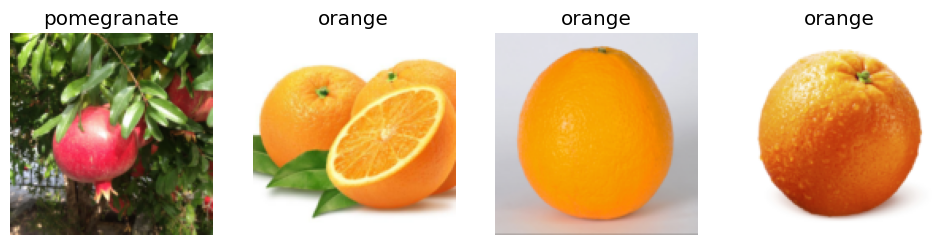

In [25]:
dls.valid.show_batch(max_n=4, nrows=1)

In [26]:
fruits = fruits.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = fruits.dataloaders(path)

In [27]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 55.4MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,1.685834,0.508011,0.222222,01:55


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


epoch,train_loss,valid_loss,error_rate,time
0,0.467987,0.165861,0.049383,02:28
1,0.384924,0.112558,0.049383,02:19
2,0.298953,0.097000,0.049383,02:20
3,0.239372,0.095547,0.061728,02:20


/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes sh

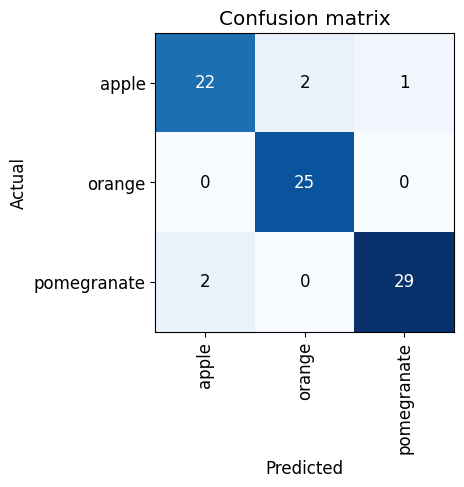

In [28]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

In [29]:
learn.predict('pomegranate.jpg')

('pomegranate', tensor(2), tensor([0.0016, 0.0011, 0.9973]))

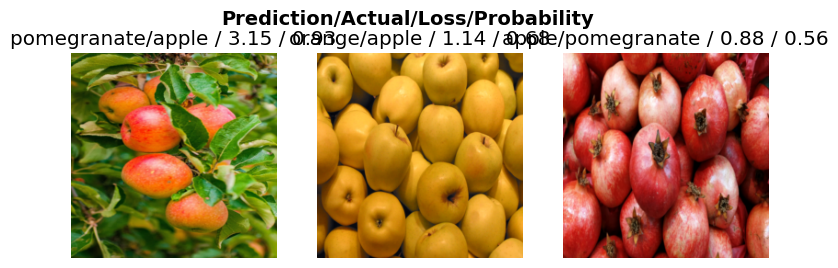

In [30]:
interp.plot_top_losses(3, nrows=1)

In [31]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/PIL/Image.py:996: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [32]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

In [33]:
learn.export()

In [34]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [35]:
learn_inf = load_learner(path/'export.pkl')

In [36]:
learn_inf.predict('pomegranate.jpg')

('pomegranate', tensor(2), tensor([0.0016, 0.0011, 0.9973]))

In [37]:
#hide_output
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [ ]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['images/grizzly.jpg'])

In [38]:
img = PILImage.create(btn_upload.data[-1])

In [39]:
#hide_output
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [40]:
pred,pred_idx,probs = learn_inf.predict(img)

In [41]:
#hide_output
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: pomegranate; Probability: 0.9973')

In [42]:
#hide_output
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [43]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [45]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [46]:
#hide_output
VBox([widgets.Label('Select your fruit!'),
      btn_upload, btn_run, out_pl, lbl_pred])

In [47]:
!pip install voila
!jupyter serverextension enable --sys-prefix voila

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.9/3.9 MB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.9/105.9 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.4/383.4 kB 28.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.4/59.4 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 130.2/130.2 kB 14.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.4/66.4 kB 8.2 MB/s eta 0:00:00
  Attempting uninstall: jupyter-client
    Found existing installation: jupyter-client 6.1.12
    Uninstalling jupyter-client-6.1.12:
      Successfully uninstalled jupyter-client-6.1.12
  Attempting uninstall: jupyter-server
    Found existing installation: jupyter-server 1.24.0
    Uninstalling jupyter-server-1.24.0:
      Successfully uninstalled jupyter-server-1.24.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of 